# Installation

In [1]:
!pip install pandas
!pip install opencv-python==4.6.0.66
!pip install seaborn
!pip install scikit-learn

# Import

In [2]:
import numpy as np
import pandas as pd 


import os
for dirname, _, filenames in os.walk('C:/Users/Admin/Downloads/Thesis Code/AutismDataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import random
import os

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models, Sequential
from tensorflow.keras import optimizers

from keras.layers.core import Dense, Dropout, Flatten
from keras.layers.convolutional import Conv2D, MaxPooling2D, SeparableConv2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications.vgg16 import VGG16

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve

C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0001.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0002.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0003.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0004.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0005.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0006.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0007.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0008.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0009.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0010.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0011.jpg
C:/Users/Admin/Downloads/Thesis Code/AutismDataset\consolidated\Autistic\0012.jpg
C:/Users/Admin/D

ModuleNotFoundError: No module named 'keras.layers.core'

# Train & Test Directories 

In [3]:
train_data = "C:/Users/Admin/Downloads/Thesis Code/AutismDataset/train"
test_data = "C:/Users/Admin/Downloads/Thesis Code/AutismDataset/test"

# Splitting Autistic & Non-Autistic

In [4]:
train_non_autistic = []
train_autistic = []

for i in os.listdir(train_data):
    if 'Non_Autistic' in i:
        train_non_autistic.append(os.path.join(train_data, i))
    else:
        train_autistic.append(os.path.join(train_data, i))

test_non_autistic = []
test_autistic = []

for i in os.listdir(test_data):
    if 'Non_Autistic' in i:
        test_non_autistic.append(os.path.join(test_data, i))
    else:
        test_autistic.append(os.path.join(test_data, i))

In [5]:
train_imgs = train_autistic + train_non_autistic
random.shuffle(train_imgs)

In [6]:
test_imgs = test_autistic + test_non_autistic
random.shuffle(test_imgs)

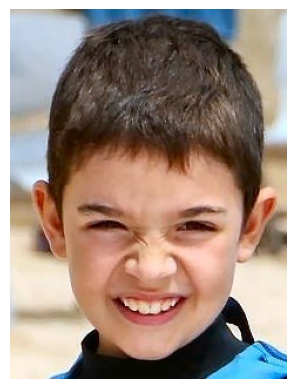

In [7]:
import matplotlib.image as mpimg
# Assuming train_imgs is a list of image file paths
for ima in train_imgs[0:1]:
    img = mpimg.imread(ima)
    imgplot = plt.imshow(img)
    plt.axis('off')  # Turn off axis for cleaner output
    plt.savefig('saved_image.png', bbox_inches='tight', pad_inches=0)  # Save the image as 'saved_image.png'
    plt.show()
    

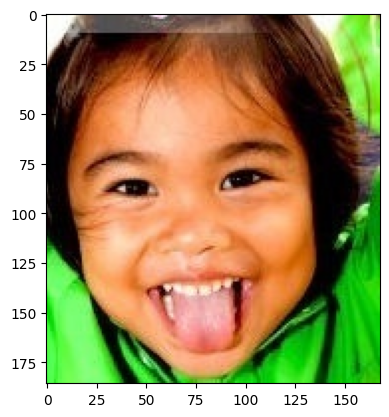

In [8]:
import matplotlib.image as mpimg
for ima in test_imgs[0:1]:
    img=mpimg.imread(ima)
    imgplot = plt.imshow(img)
    plt.show()

# Resizing The Images

In [9]:
def read_and_process_image(list_of_images):
    X = []
    y = []
    
    for image_path in list_of_images:
        # Read and resize the image
        img = cv2.resize(cv2.imread(image_path, cv2.IMREAD_COLOR), (224, 224), interpolation=cv2.INTER_CUBIC)
        
        if 'Non_Autistic' in image_path:
            y.append(0)
        else:
            y.append(1)
            
    return X, y

X_train, y_train = read_and_process_image(train_imgs)
X_test, y_test = read_and_process_image(test_imgs)


# Validation Data

In [10]:
val_autistic = "/Users/Admin/Downloads/Thesis Code/AutismDataset/valid/Autistic"
val_non_autistic = "/Users/Admin/Downloads/Thesis Code/AutismDataset/valid/Non_Autistic"
val_autistic_imgs = ["/Users/Admin/Downloads/Thesis Code/AutismDataset/valid/Autistic/{}".format(i) for i in os.listdir(val_autistic)]
val_non_autistic_imgs = ["/Users/Admin/Downloads/Thesis Code/AutismDataset/valid/Non_Autistic/{}".format(i) for i in os.listdir(val_non_autistic)]
val_imgs = val_autistic_imgs + val_non_autistic_imgs
random.shuffle(val_imgs)

In [11]:
X_val, y_val = read_and_process_image(val_imgs)

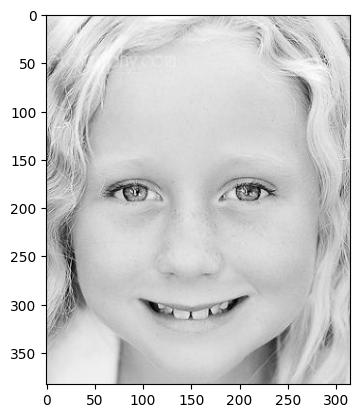

In [12]:
import matplotlib.image as mpimg
for ima in val_imgs[0:1]:
    img=mpimg.imread(ima)
    imgplot = plt.imshow(img)
    plt.show()

# Preprocessing 

In [13]:
def preprocess_image(train_data, target_size=(224, 224)):
    # Read the image
    image = cv2.imread(train_data, cv2.IMREAD_COLOR)
    
    # Resize the image
    if target_size:
        image = cv2.resize(image, target_size, interpolation=cv2.INTER_CUBIC)
    
    # Normalize pixel values
    image = image / 255.0
#     image = image / 255.0
    
    return image

X_train = [preprocess_image(train_data) for train_data in train_imgs]
X_test = [preprocess_image(test_data) for test_data in test_imgs]
X_val = [preprocess_image(val_data) for val_data in val_imgs]


# Converting Train & Val Data To np Array


In [14]:
X_val = np.array(X_val)
y_val = np.array(y_val)
X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

# Data Augmentation

In [15]:
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# import cv2
# import numpy as np

# # Generating Larger DataSet - Data Augmentation
# train_datagen = ImageDataGenerator(
#     rescale=1./255,
#     zoom_range=0.2,
#     brightness_range=[0.7, 1.3],  # Adjust brightness
# )

# val_datagen = ImageDataGenerator(rescale=1./255)
# test_datagen = ImageDataGenerator(rescale=1./255)

# # Creating ImageDataGenerator generators
# batch_size = 32
# train_generator = train_datagen.flow(X_train, y_train, batch_size=batch_size)
# val_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
# test_generator = test_datagen.flow(X_test, y_test, batch_size=batch_size)


# Feature Extraction (vgg16,vgg19,mobilenet,xception,efficentnet)

In [16]:
def calculate_cosine_similarity(vector1, vector2):
    """
    Calculate cosine similarity between two vectors.

    Parameters:
    vector1 (numpy.ndarray): First feature vector.
    vector2 (numpy.ndarray): Second feature vector.

    Returns:
    float: Cosine similarity between the two input vectors.
    """
    dot_product = np.dot(vector1, vector2)
    norm_vector1 = np.linalg.norm(vector1)
    norm_vector2 = np.linalg.norm(vector2)
    
    cosine_similarity = dot_product / (norm_vector1 * norm_vector2)
    
    return cosine_similarity

In [18]:
import numpy as np
import cv2
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.applications import Xception, VGG19, MobileNet, VGG16, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D

from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_input_vgg16
from tensorflow.keras.applications.vgg19 import preprocess_input as preprocess_input_vgg19
from tensorflow.keras.applications.mobilenet import preprocess_input as preprocess_input_mobilenet
from tensorflow.keras.applications.xception import preprocess_input as preprocess_input_xception
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_input_efficientnetb0

# Define a function for feature extraction using a pre-trained model
def extract_features(model, X_data, input_size=(224, 224)):
    base_model = model(weights='imagenet', include_top=False, input_shape=(input_size[0], input_size[1], 3))
    model = Model(inputs=base_model.input, outputs=GlobalAveragePooling2D()(base_model.output))

    features = []
    for img in X_data:
        img = cv2.resize(img, (input_size[0], input_size[1]))  # Resize or crop to match the model's input size
        img = np.expand_dims(img, axis=0)
        if model == Xception:
            img = preprocess_input_xception(img.copy())
        elif model == VGG19:
            img = preprocess_input_vgg19(img.copy())
        elif model == MobileNet:
            img = preprocess_input_mobilenet(img.copy())
        elif model == VGG16:
            img = preprocess_input_vgg16(img.copy())
        elif model == EfficientNetB0:
            img = preprocess_input_efficientnetb0(img.copy())
        features.append(model.predict(img))

    return np.vstack(features)

# Assuming you have X_train, X_val, y_train_encoded, and y_val_encoded from your previous code

# # Define the models
# models = [Xception, VGG19, MobileNet, VGG16, EfficientNetB0]

# Initialize lists to store extracted features
X_train_features = []
X_val_features = []
X_test_features = []

X_train_features_Xception = extract_features(Xception, X_train)
X_train_features_VGG19 = extract_features(VGG19, X_train)
X_train_features_MobileNet = extract_features(MobileNet, X_train)
X_train_features_VGG16 = extract_features(VGG16, X_train)
X_train_features_EfficientNetB0 = extract_features(EfficientNetB0, X_train)

X_val_features_Xception = extract_features(Xception, X_val)
X_val_features_VGG19 = extract_features(VGG19, X_val)
X_val_features_MobileNet = extract_features(MobileNet, X_val)
X_val_features_VGG16 = extract_features(VGG16, X_val)
X_val_features_EfficientNetB0 = extract_features(EfficientNetB0, X_val)

X_test_features_Xception = extract_features(Xception, X_test)
X_test_features_VGG19 = extract_features(VGG19, X_test)
X_test_features_MobileNet = extract_features(MobileNet, X_test)
X_test_features_VGG16 = extract_features(VGG16, X_test)
X_test_features_EfficientNetB0 = extract_features(EfficientNetB0, X_test)



1/1 [==============================] - 0s 143ms/step


1/1 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 91ms/step


1/1 [==============================] - 0s 103ms/step


1/1 [==============================] - 0s 102ms/step


1/1 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 96ms/step


1/1 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 177ms/step


1/1 [==============================] - 0s 103ms/step


1/1 [==============================] - 0s 94ms/step


1/1 [==============================] - 0s 105ms/step


1/1 [==============================] - 0s 96ms/step


1/1 [==============================] - 0s 100ms/step


1/1 [==============================] - 0s 100ms/step


1/1 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 205ms/step


1/1 [==============================] - 0s 182ms/step


1/1 [==============================] - 0s 201ms/step


1/1 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 181ms/step


1/1 [==============================] - 0s 182ms/step


1/1 [==============================] - 0s 221ms/step


1/1 [==============================] - 0s 188ms/step


1/1 [==============================] - 0s 230ms/step


1/1 [==============================] - 0s 200ms/step


1/1 [==============================] - 0s 238ms/step


1/1 [==============================] - 0s 239ms/step


1/1 [==============================] - 0s 179ms/step


1/1 [==============================] - 0s 184ms/step


1/1 [==============================] - 0s 227ms/step


1/1 [==============================] - 0s 181ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 41ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 159ms/step


1/1 [==============================] - 0s 182ms/step


1/1 [==============================] - 0s 160ms/step


1/1 [==============================] - 0s 170ms/step


1/1 [==============================] - 0s 150ms/step


1/1 [==============================] - 0s 144ms/step


1/1 [==============================] - 0s 146ms/step


1/1 [==============================] - 0s 159ms/step


1/1 [==============================] - 0s 147ms/step


1/1 [==============================] - 0s 147ms/step


1/1 [==============================] - 0s 182ms/step


1/1 [==============================] - 0s 145ms/step


1/1 [==============================] - 0s 144ms/step


1/1 [==============================] - 0s 160ms/step


1/1 [==============================] - 0s 169ms/step


1/1 [==============================] - 0s 148ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 53ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 205ms/step


1/1 [==============================] - 0s 101ms/step


1/1 [==============================] - 0s 104ms/step


1/1 [==============================] - 0s 207ms/step


1/1 [==============================] - 0s 210ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 144ms/step


1/1 [==============================] - 0s 143ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 47ms/step


In [22]:
print("X_train_features_Xception:")
print("Number of feature vectors:", len(X_train_features_Xception))
for i, array in enumerate(X_train_features_Xception):
    print("Features for image", i+1, ":", array)

print("\nX_train_features_VGG19:")
print("Number of feature vectors:", len(X_train_features_VGG19))
for i, array in enumerate(X_train_features_VGG19):
    print("Features for image", i+1, ":", array)

print("\nX_train_features_MobileNet:")
print("Number of feature vectors:", len(X_train_features_MobileNet))
for i, array in enumerate(X_train_features_MobileNet):
    print("Features for image", i+1, ":", array)

print("\nX_train_features_VGG16:")
print("Number of feature vectors:", len(X_train_features_VGG16))
for i, array in enumerate(X_train_features_VGG16):
    print("Features for image", i+1, ":", array)

print("\nX_train_features_EfficientNetB0:")
print("Number of feature vectors:", len(X_train_features_EfficientNetB0))
for i, array in enumerate(X_train_features_EfficientNetB0):
    print("Features for image", i+1, ":", array)


X_train_features_Xception:
Number of feature vectors: 2540
Features for image 1 : [0.00272745 0.18695538 0.08322649 ... 0.         0.49676803 0.19586825]
Features for image 2 : [0.08571436 0.         0.64603186 ... 0.00653054 0.         0.27704853]
Features for image 3 : [0.07342798 0.09995387 0.08909838 ... 0.00335485 0.         0.03750473]
Features for image 4 : [0.00768272 0.         0.00178792 ... 0.01907799 0.         0.03474608]
Features for image 5 : [0.00532711 0.00097333 0.         ... 0.         0.         0.16823834]
Features for image 6 : [0.01566803 0.04050676 0.         ... 0.         0.04237426 0.06928564]
Features for image 7 : [0.         0.00470695 0.00019178 ... 0.00113442 0.00468654 0.        ]
Features for image 8 : [0. 0. 0. ... 0. 0. 0.]
Features for image 9 : [0.05610843 0.03229222 0.3375991  ... 0.         0.         0.30845186]
Features for image 10 : [0.00674004 0.01136479 0.00355266 ... 0.         0.         0.04538938]
Features for image 11 : [0.00438631 0.

Features for image 2205 : [0.         0.01677507 0.02900181 ... 0.05243717 0.         0.0110125 ]
Features for image 2206 : [0.00133684 0.01169204 0.21877801 ... 0.         0.         0.42451423]
Features for image 2207 : [0.01601353 0.         0.         ... 0.         0.         0.05663808]
Features for image 2208 : [0.0916395  0.0423995  0.19086818 ... 0.00213831 0.01235984 0.43205622]
Features for image 2209 : [0.         0.01650295 0.03246429 ... 0.         0.         0.        ]
Features for image 2210 : [0.00415137 0.06753704 0.21273322 ... 0.         0.         0.        ]
Features for image 2211 : [0.00712877 0.         0.         ... 0.         0.         0.11872091]
Features for image 2212 : [0.00076177 0.11772519 0.13389452 ... 0.00258416 0.00173873 0.02217144]
Features for image 2213 : [0.         0.         0.00104259 ... 0.         0.         0.3341787 ]
Features for image 2214 : [0.21478678 0.01199224 0.00707264 ... 0.         0.00086839 0.07800559]
Features for image 2

Features for image 74 : [5.61847925e-01 0.00000000e+00 4.56744246e-02 2.46060774e-01
 2.99482048e-01 3.49720158e-02 4.36741337e-02 0.00000000e+00
 8.65621343e-02 1.21190727e-01 1.09980078e-02 0.00000000e+00
 1.75665721e-01 6.12530950e-03 5.82104491e-04 3.60640436e-01
 3.85224298e-02 1.11700386e-01 9.15904902e-03 8.47056285e-02
 7.98692810e-04 2.41210731e-03 1.12717235e-02 3.03411275e-01
 9.69630480e-02 0.00000000e+00 9.16339040e-01 1.22723095e-01
 2.19936967e-01 6.21483289e-02 4.36690629e-01 6.32184148e-01
 3.16576749e-01 2.94466943e-01 1.55423814e-02 0.00000000e+00
 2.86963701e-01 1.42329251e-02 1.65963024e-02 2.29104105e-02
 0.00000000e+00 0.00000000e+00 1.16457470e-01 3.63637391e-03
 4.19826880e-02 7.04222918e-02 1.40624605e-02 5.18958606e-02
 0.00000000e+00 2.19121993e-01 3.15806977e-02 1.01927876e-01
 7.59197474e-02 0.00000000e+00 5.04250824e-02 1.05386722e+00
 2.66901761e-01 1.08681833e-02 6.00444302e-02 1.18663824e+00
 8.34280066e-03 1.73037453e-03 7.33204484e-02 3.84042263e-01


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[2.08098307e-01 0.00000000e+00 6.23190142e-02 1.48335174e-01
 3.06982189e-01 0.00000000e+00 5.95437586e-02 3.10466858e-03
 1.91192478e-02 3.22132856e-02 1.62675362e-02 0.00000000e+00
 3.75582397e-01 0.00000000e+00 0.00000000e+00 1.44669980e-01
 1.70095079e-02 1.62221834e-01 1.50394710e-02 5.86054055e-04
 0.00000000e+00 2.78694686e-02 3.38875619e-03 1.49865374e-01
 8.22793096e-02 0.00000000e+00 5.78715861e-01 8.84462744e-02
 2.62189746e-01 0.00000000e+00 1.81947887e-01 1.84789255e-01
 2.86562443e-01 4.61055160e-01 6.14524968e-02 1.40325995e-02
 1.31748915e-01 9.28761554e-04 0.00000000e+00 4.21210341e-02
 0.00000000e+00 0.00000000e+00 2.06824630e-01 0.00000000e+00
 1.35127530e-02 2.15042345e-02 5.44045419e-02 1.28648523e-02
 0.00000000e+00 2.26347849e-01 1.42197050e-02 1.00426234e-01
 1.66040018e-01 0.00000000e+00 1.37251183e-01 6.93976164e-01
 4.09940988e-01 1.44758867e-02 1.19138539e-01 4.31043088e-01
 6.18921146e-02 2.77736895e-02 6.28108680e-02 2.90512472e-01
 3.10763195e-02 0.000000

Features for image 1108 : [0.21287163 0.3044076  0.10432383 ... 0.37163273 0.40021485 0.        ]
Features for image 1109 : [0.         0.16485962 0.14009853 ... 0.26986474 0.02548061 0.04791975]
Features for image 1110 : [0.07149709 0.         0.24230213 ... 2.1648455  0.06899498 0.75646085]
Features for image 1111 : [1.034089   0.         0.36553088 ... 0.617715   0.3359639  0.14438142]
Features for image 1112 : [0.00179585 0.5569579  0.15542418 ... 1.1177164  0.00759378 0.0322003 ]
Features for image 1113 : [0.07244672 0.0538091  0.11040715 ... 1.0402654  0.05369777 0.08940358]
Features for image 1114 : [0.3340449  0.06338131 0.05885496 ... 0.11611647 0.         0.29764023]
Features for image 1115 : [0.10618331 0.14075097 0.06967714 ... 1.7921083  0.24114119 0.01728409]
Features for image 1116 : [0.23166893 0.         0.37514952 ... 1.0659521  0.         0.01319307]
Features for image 1117 : [0.01965802 0.01287763 0.5273314  ... 0.67217034 0.04417958 0.        ]
Features for image 1

Features for image 23 : [2.44624153e-01 0.00000000e+00 1.56496704e-01 6.94136694e-02
 6.34370446e-02 0.00000000e+00 0.00000000e+00 2.90354371e-01
 1.89844482e-02 1.93631500e-01 1.04376171e-02 2.55425042e-03
 3.74600217e-02 1.13419187e-03 5.87922595e-02 1.40598401e-01
 0.00000000e+00 9.45035964e-02 0.00000000e+00 2.16869041e-02
 0.00000000e+00 1.99982971e-01 0.00000000e+00 4.21519518e-01
 2.72760224e-02 0.00000000e+00 4.03207392e-01 2.65394896e-02
 2.76339501e-02 2.86371410e-02 1.28033245e-03 4.53330874e-01
 5.62900245e-01 4.14407998e-01 2.11019907e-02 4.94447211e-03
 1.17706023e-01 0.00000000e+00 0.00000000e+00 3.74943912e-02
 1.91653753e-03 4.83602285e-03 1.60956576e-01 8.81432835e-03
 4.55590665e-01 1.35351056e-02 5.78547940e-02 6.75162077e-02
 0.00000000e+00 1.90646559e-01 3.89542989e-02 1.80257130e-02
 4.00577933e-02 2.63640545e-02 7.65008153e-04 4.47935909e-01
 2.27094010e-01 9.35223475e-02 0.00000000e+00 5.96663237e-01
 5.10994159e-02 0.00000000e+00 4.76560779e-02 4.25103009e-01


Features for image 109 : [5.00881016e-01 0.00000000e+00 2.03400910e-01 3.50456387e-01
 1.41900167e-01 1.49339726e-02 0.00000000e+00 1.34480044e-01
 2.39290610e-01 3.06795657e-01 4.46283771e-03 1.01820352e-02
 1.16504416e-01 1.35443741e-02 0.00000000e+00 1.11901313e-01
 2.87543312e-02 2.69845594e-02 4.06370051e-02 7.40934815e-03
 1.16300955e-02 0.00000000e+00 2.42482573e-02 6.20970070e-01
 3.59067246e-02 0.00000000e+00 6.63239062e-01 1.15887642e-01
 0.00000000e+00 2.23975003e-01 1.50278006e-02 8.97413671e-01
 5.43365955e-01 3.25564414e-01 8.47195014e-02 2.66853236e-02
 2.33118698e-01 0.00000000e+00 8.16938281e-03 1.18396476e-01
 0.00000000e+00 4.34346683e-02 1.14178605e-01 0.00000000e+00
 2.25740984e-01 3.09129874e-03 9.27613825e-02 7.10102916e-02
 0.00000000e+00 2.86939502e-01 1.78323388e-01 5.52744465e-03
 3.03282030e-02 0.00000000e+00 2.47282028e-01 4.61553991e-01
 1.12547025e-01 1.65997207e-01 0.00000000e+00 1.17632341e+00
 1.65124401e-01 0.00000000e+00 2.16788560e-01 1.83527678e-01

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[2.99474299e-01 0.00000000e+00 1.60204113e-01 7.27153048e-02
 6.52677640e-02 0.00000000e+00 2.34280508e-02 6.25800192e-02
 5.40984496e-02 3.76342013e-02 0.00000000e+00 3.55054857e-03
 1.68781340e-01 0.00000000e+00 1.37249995e-02 1.37342274e-01
 5.05759455e-02 7.00963289e-02 2.25376580e-02 2.34616529e-02
 0.00000000e+00 1.91464890e-02 1.14949215e-02 4.66257602e-01
 3.91090438e-02 0.00000000e+00 4.33857322e-01 5.18896692e-02
 5.68233605e-04 4.40624654e-02 1.07512791e-02 2.40778819e-01
 5.73197365e-01 3.82632732e-01 6.69310316e-02 0.00000000e+00
 9.75970253e-02 8.23310763e-03 4.16886387e-03 2.71939747e-02
 0.00000000e+00 1.29953148e-02 6.49793372e-02 4.78391629e-03
 1.29474521e-01 2.76001673e-02 1.54939163e-02 6.76339269e-02
 9.77881136e-04 6.01204261e-02 2.92973854e-02 0.00000000e+00
 5.92165180e-02 0.00000000e+00 6.38907552e-02 3.53957266e-01
 1.64600432e-01 6.20610863e-02 0.00000000e+00 5.25180101e-01
 1.63445085e-01 0.00000000e+00 1.76974609e-01 1.71702385e-01
 4.53120883e-04 0.000000

Features for image 1767 : [1.58247367e-01 0.00000000e+00 1.11676112e-01 2.37022072e-01
 5.70865981e-02 0.00000000e+00 0.00000000e+00 6.26007468e-02
 1.90611154e-01 1.74584851e-01 1.46904737e-02 0.00000000e+00
 1.24076158e-02 0.00000000e+00 0.00000000e+00 9.60606784e-02
 2.73793028e-03 6.30135089e-02 4.58985455e-02 6.63906196e-03
 3.10649090e-02 5.72827496e-02 0.00000000e+00 6.00098670e-01
 2.62495838e-02 0.00000000e+00 4.88305777e-01 8.70666280e-02
 1.49101838e-02 1.24834135e-01 2.60242983e-03 2.55588263e-01
 5.40431082e-01 3.23112279e-01 7.70531744e-02 0.00000000e+00
 1.50912166e-01 2.06609280e-03 0.00000000e+00 5.81872836e-02
 0.00000000e+00 3.40105523e-03 1.01214893e-01 0.00000000e+00
 1.59551993e-01 1.53519884e-02 9.50037688e-02 7.67827407e-02
 2.24310978e-04 2.37843379e-01 3.66051085e-02 3.31321382e-03
 2.62682661e-02 0.00000000e+00 5.18206283e-02 3.87734622e-01
 2.19031781e-01 1.22446641e-01 0.00000000e+00 6.99999571e-01
 5.36309369e-02 0.00000000e+00 7.97382295e-02 3.78145963e-0

Features for image 1892 : [1.83100462e-01 0.00000000e+00 9.69589353e-02 1.51458114e-01
 1.39096305e-01 0.00000000e+00 1.18519617e-02 2.40315069e-02
 1.92189768e-01 6.75255358e-02 0.00000000e+00 2.27596499e-02
 9.10398830e-03 0.00000000e+00 0.00000000e+00 1.58092320e-01
 2.05675345e-02 1.20071597e-01 0.00000000e+00 8.47437070e-04
 7.56906122e-02 3.48847918e-02 8.50066834e-04 6.27230167e-01
 7.05842441e-03 0.00000000e+00 4.17228997e-01 1.22143611e-01
 8.64215009e-03 2.42306255e-02 0.00000000e+00 4.72573370e-01
 5.88410497e-01 4.45954889e-01 2.33661026e-01 0.00000000e+00
 2.48697013e-01 0.00000000e+00 0.00000000e+00 6.31164163e-02
 0.00000000e+00 8.59056320e-03 5.22737987e-02 3.07873320e-02
 2.79318750e-01 5.88263310e-02 2.34170146e-02 1.20287668e-02
 0.00000000e+00 9.40554067e-02 8.73531252e-02 0.00000000e+00
 7.44065344e-02 0.00000000e+00 1.43766016e-01 5.45665443e-01
 9.05009285e-02 4.42717336e-02 6.20473409e-04 9.54152346e-01
 1.27919570e-01 0.00000000e+00 1.40532693e-02 5.82517624e-0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [20]:
# import numpy as np

# # Flatten the lists of feature vectors
# Xception_flat = np.concatenate(X_train_features_Xception)
# VGG19_flat = np.concatenate(X_train_features_VGG19)
# MobileNet_flat = np.concatenate(X_train_features_MobileNet)
# VGG16_flat = np.concatenate(X_train_features_VGG16)
# EfficientNetB0_flat = np.concatenate(X_train_features_EfficientNetB0)

# # Find common features among all models
# common_features = np.intersect1d(Xception_flat, VGG19_flat)
# common_features = np.intersect1d(common_features, MobileNet_flat)
# common_features = np.intersect1d(common_features, VGG16_flat)
# common_features = np.intersect1d(common_features, EfficientNetB0_flat)

# # Print the number of common features found
# print("Number of common features among all models:", len(common_features))


Number of common features among all models: 0


In [25]:
# # Initialize list to store common features between Xception and VGG19
# com1 = []

# # Define a threshold for similarity
# threshold = 0.99  # Adjust this value as needed

# # Iterate over Xception features
# for xception_feature in X_train_features_Xception:
#     # Iterate over VGG19 features
#     for vgg19_feature in X_train_features_VGG19:
#         # Ensure feature vectors have the same dimensions
#         if xception_feature.shape == vgg19_feature.shape:
#             # Calculate cosine similarity between Xception and VGG19 features
#             similarity = calculate_cosine_similarity(xception_feature, vgg19_feature)
            
#             # If similarity is above threshold, consider it a common feature
#             if similarity >= threshold:
#                 com1.append(xception_feature)
#                 break  # Break out of the inner loop if a common feature is found

# # Convert list to numpy array
# com1 = np.vstack(com1)

# # Print the number of common features found
# print("Number of common features between Xception and VGG19:", len(com1))


In [ ]:
# # Calculate the lengths of the arrays
# len_common_X_train_features_std = len(common_X_train_features_std)
# len_common_X_val_features_std = len(common_X_val_features_std)
# len_common_X_test_features_std = len(common_X_test_features_std)

# print("Length of common_X_train_features_std:", len_common_X_train_features_std)
# print("Length of common_X_val_features_std:", len_common_X_val_features_std)
# print("Length of common_X_test_features_std:", len_common_X_test_features_std)


# ANOVA Analysis

In [31]:
from sklearn.feature_selection import SelectKBest, f_classif

# Perform ANOVA analysis
k_best = SelectKBest(f_classif, k='all')

X_train_selected = k_best.fit_transform(common_X_train_features_std, y_train)
X_test_selected = k_best.transform(common_X_test_features_std)

X_val_selected = k_best.transform(common_X_val_features_std)

# Print selected features
selected_features_indices = np.where(k_best.get_support())[0]
print("Selected Features Indices:", selected_features_indices)


Selected Features Indices: [   0    1    2 ... 5373 5374 5375]


In [239]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

def build_binary_dnn_model(input_dim):
    model = Sequential([
        Dense(1024, activation='relu', input_dim=input_dim),
        Dropout(0.5),
        Dense(512, activation='relu'),
        Dropout(0.3),
        Dense(256, activation='relu'),
        Dense(1, activation='sigmoid')  # Binary classification with one output neuron and 'sigmoid' activation
    ])

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model


num_selected_features = len(selected_features_indices)
dnn_model = build_binary_dnn_model(num_selected_features)




In [240]:
# import tensorflow as tf
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# def build_binary_dnn_model(input_dim):
#     model = Sequential([
#         Dense(512, activation='relu', input_dim=input_dim),
#         BatchNormalization(),
#         Dropout(0.5),
#         Dense(256, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.5),
#         Dense(128, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.3),
#         Dense(1, activation='sigmoid')
#     ])

#     model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
#     return model

# # Assuming num_selected_features is defined
# num_selected_features = len(selected_features_indices)
# dnn_model = build_binary_dnn_model(num_selected_features)

# # Define callbacks for early stopping and model checkpointing
# early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
# model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)

In [241]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the ModelCheckpoint callback
checkpoint = ModelCheckpoint('model_checkpoint.h5', 
                             monitor='val_accuracy', 
                             save_best_only=True, 
                             mode='max', 
                             verbose=1)

In [242]:


loss_fn = tf.keras.losses.BinaryCrossentropy()
optimizer = tf.keras.optimizers.Adam()


In [243]:
# Fit the model with validation data
history = dnn_model.fit(X_train_selected, y_train, 
                         epochs=20, 
                         batch_size=32, 
                         validation_data=(X_val_selected, y_val), 
                         callbacks=[checkpoint])


# Train the model with callbacks
# history = dnn_model.fit(X_train_selected, y_train, epochs=20, batch_size=32, validation_data=(X_val_selected, y_val), callbacks=[early_stopping, model_checkpoint])


Epoch 1/20
79/80 [============================>.] - ETA: 0s - loss: 0.8745 - accuracy: 0.6978
Epoch 1: val_accuracy improved from -inf to 0.77000, saving model to model_checkpoint.h5
80/80 [==============================] - 4s 40ms/step - loss: 0.8711 - accuracy: 0.6992 - val_loss: 0.5192 - val_accuracy: 0.7700
Epoch 2/20
 3/80 [>.............................] - ETA: 2s - loss: 0.7423 - accuracy: 0.7917

C:\Users\Admin\.conda\envs\thesis\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


79/80 [============================>.] - ETA: 0s - loss: 0.5535 - accuracy: 0.7975
Epoch 2: val_accuracy did not improve from 0.77000
80/80 [==============================] - 3s 37ms/step - loss: 0.5527 - accuracy: 0.7976 - val_loss: 0.6351 - val_accuracy: 0.7300
Epoch 3/20
79/80 [============================>.] - ETA: 0s - loss: 0.4075 - accuracy: 0.8402
Epoch 3: val_accuracy improved from 0.77000 to 0.78000, saving model to model_checkpoint.h5
80/80 [==============================] - 3s 39ms/step - loss: 0.4076 - accuracy: 0.8406 - val_loss: 0.4623 - val_accuracy: 0.7800
Epoch 4/20
79/80 [============================>.] - ETA: 0s - loss: 0.3195 - accuracy: 0.8667
Epoch 4: val_accuracy improved from 0.78000 to 0.84000, saving model to model_checkpoint.h5
80/80 [==============================] - 3s 41ms/step - loss: 0.3195 - accuracy: 0.8669 - val_loss: 0.4037 - val_accuracy: 0.8400
Epoch 5/20
79/80 [============================>.] - ETA: 0s - loss: 0.2394 - accuracy: 0.9011
Epoch 5: v

In [244]:
# Evaluate the model on the test data
test_loss, test_accuracy = dnn_model.evaluate(X_test_selected, y_test)
print("Test Accuracy:", test_accuracy*100)

10/10 [==============================] - 0s 4ms/step - loss: 0.6001 - accuracy: 0.8700
Test Accuracy: 87.00000047683716


In [245]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix


# Define a function to predict labels using the model
def predict_labels(X_data):
    predictions = dnn_model.predict(X_data)
    # Convert probabilities to class labels using a threshold (e.g., 0.5)
    threshold = 0.5
    y_pred = np.where(predictions > threshold, 1, 0)
    return y_pred

# Predict labels for test set
y_test_pred = predict_labels(X_test_selected)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_test_pred)

# Calculate precision
precision = precision_score(y_test, y_test_pred)

# Calculate recall
recall = recall_score(y_test, y_test_pred)

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

print("Test Accuracy:", accuracy * 100)  # Multiply by 100 to represent as percentage
print("Test Precision:", precision * 100)
print("Test Recall:", recall * 100)
print("Confusion Matrix:")
print(conf_matrix)


10/10 [==============================] - 0s 4ms/step
Test Accuracy: 87.0
Test Precision: 87.24832214765101
Test Recall: 86.66666666666667
Confusion Matrix:
[[131  19]
 [ 20 130]]


# Memory Release

In [25]:
import gc

In [45]:
del X_train_features, X_val_features, X_train, X_val
gc.collect()  

# Training And Val Loss

In [42]:
# plt.figure(figsize=(12, 8))
# sns.lineplot(data=history_df.loc[:, ["loss", "val_loss"]], palette=['b', 'r'], dashes=False)
# sns.set_style("whitegrid")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.title("Training and Validation Loss")

## Classification Report

In [45]:
# cl_report = classification_report(y_test, predictions)
# print(cl_report)

## Confusion Matrix 

In [46]:
# cn_matrix= confusion_matrix(y_test, predictions)
# cn_matrix

## Plotting the True Positives, True Negatives, False Positives and False Negatives 

In [47]:
# # Plotting the True Positives, True Negatives, False Positives and False Negatives from model's predictions
# f, ax = plt.subplots(figsize = (8,6))
# ax = sns.heatmap(cn_matrix, annot=True)
# ax.set_xlabel("Predicted")
# ax.set_ylabel("True")
# ax.set_title("Confusion Matrix")